We should be able to see good alpha waves and SSVEP signals.

In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import matplotlib
font = {'size'   : 50}

matplotlib.rc('font', **font)

In [4]:
from glob import glob

import Modularized_Data_Processing as mdp 

In [52]:
# path_Nat = r"C:\Users\words\OneDrive - Regis University\laryngeal_bci\data\fifs\\"
path_Sam = r"C:\Users\Owner\OneDrive - Regis University\laryngeal_bci\data\fifs\\"
files = glob(path_Sam + '*_raw.fif.gz')
files

['C:\\Users\\Owner\\OneDrive - Regis University\\laryngeal_bci\\data\\fifs\\BCIproject_trial-N-1.2-22-2021_raw.fif.gz',
 'C:\\Users\\Owner\\OneDrive - Regis University\\laryngeal_bci\\data\\fifs\\BCIproject_trial-N-2.2-22-2021_raw.fif.gz',
 'C:\\Users\\Owner\\OneDrive - Regis University\\laryngeal_bci\\data\\fifs\\BCIproject_trial-N-3.2-22-2021_raw.fif.gz',
 'C:\\Users\\Owner\\OneDrive - Regis University\\laryngeal_bci\\data\\fifs\\BCIproject_trial-S-1.3-4-2021_raw.fif.gz',
 'C:\\Users\\Owner\\OneDrive - Regis University\\laryngeal_bci\\data\\fifs\\BCIproject_trial-S-2.3-8-2021_raw.fif.gz',
 'C:\\Users\\Owner\\OneDrive - Regis University\\laryngeal_bci\\data\\fifs\\BCIproject_trial-S-3.3-25-2021_raw.fif.gz']

In [53]:
data = mdp.load_data(files[-2])
data = mdp.clean_data(data)

Opening raw data file C:\Users\Owner\OneDrive - Regis University\laryngeal_bci\data\fifs\BCIproject_trial-S-2.3-8-2021_raw.fif.gz...
    Range : 0 ... 449998 =      0.000 ...   449.998 secs
Ready.
Reading 0 ... 449998  =      0.000 ...   449.998 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1651 samples (1.651 sec)

removing first 2 seconds


In [29]:
%matplotlib 

Using matplotlib backend: Qt5Agg


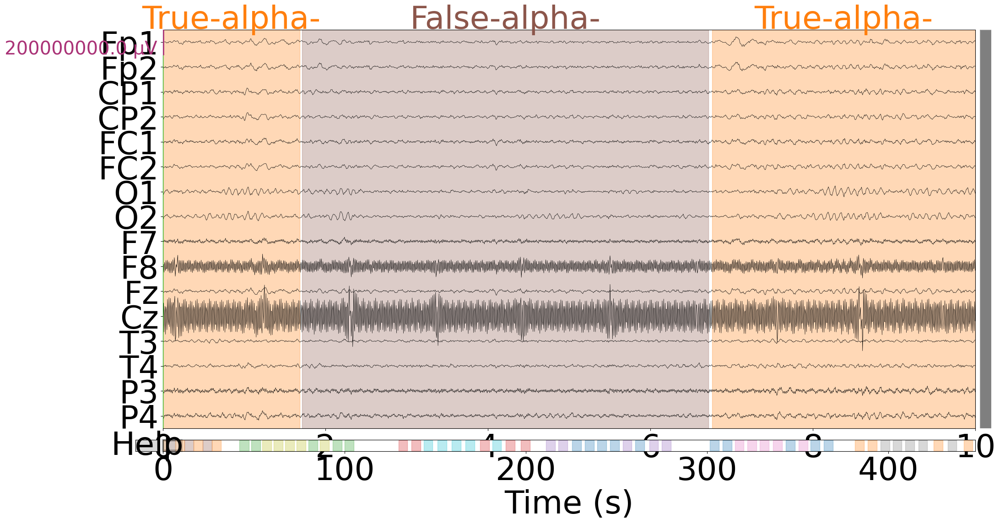

In [30]:
data.plot(scalings=100)

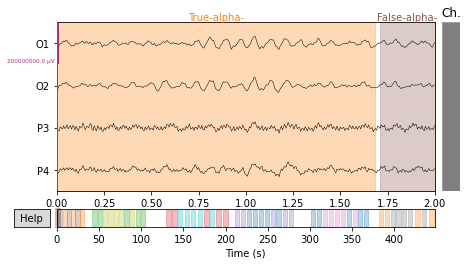

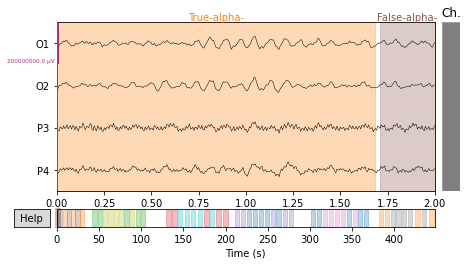

In [44]:
chns = data.info.ch_names

picks= ["O1", "O2", "P3", "P4"]

chn_idxs = [chns.index(chn) for chn in picks]

data.plot(scalings=100, order=chn_idxs, n_channels=4, duration=2)

## Get standard deviation of channels

In [18]:
data.to_data_frame().std()

14477236.298383279

## Try to clean data with ICA - seems like N-1.2-22 has noise in P4

In [39]:
from mne.preprocessing import ICA

ica = ICA(n_components=15, random_state=97)
ica.fit(data)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 15 components
Fitting ICA took 136.5s.


<ICA | raw data decomposition, fit (fastica): 449999 samples, 15 components, channels used: "eeg">

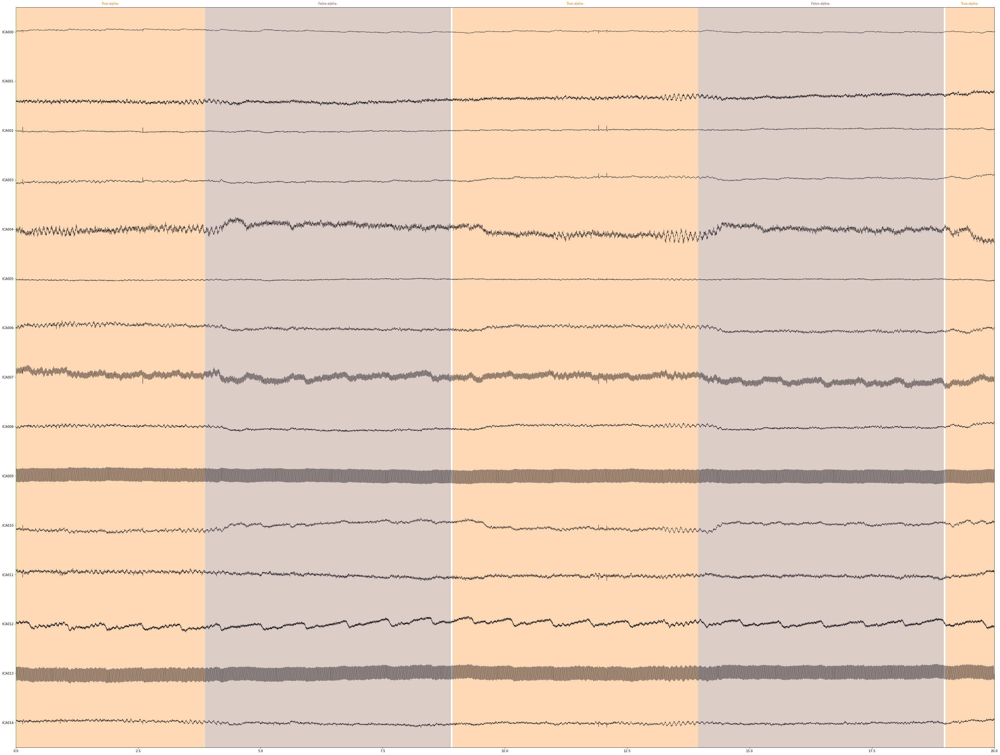

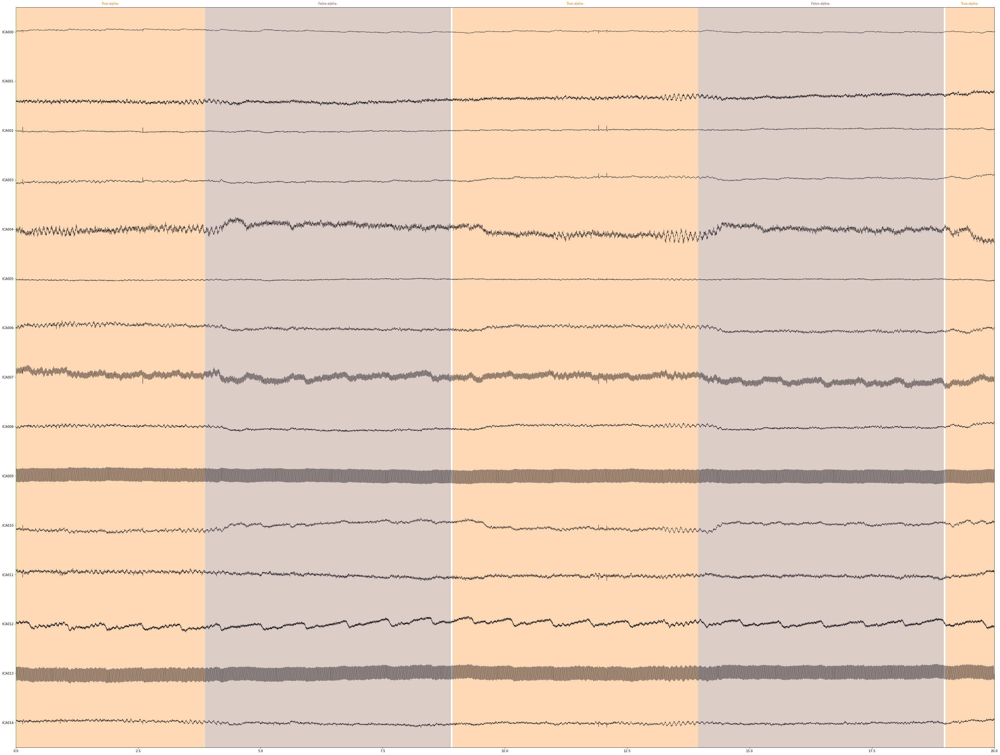

In [42]:
ica.plot_sources(data, show_scrollbars=False)

In [43]:
ica.exclude = [9, 13]
data_copy = data.copy()
ica.apply(data_copy)

Transforming to ICA space (15 components)
Zeroing out 2 ICA components


<Raw | BCIproject_trial-N-1.2-22-2021_raw.fif.gz, 16 x 449999 (450.0 s), ~55.0 MB, data loaded>

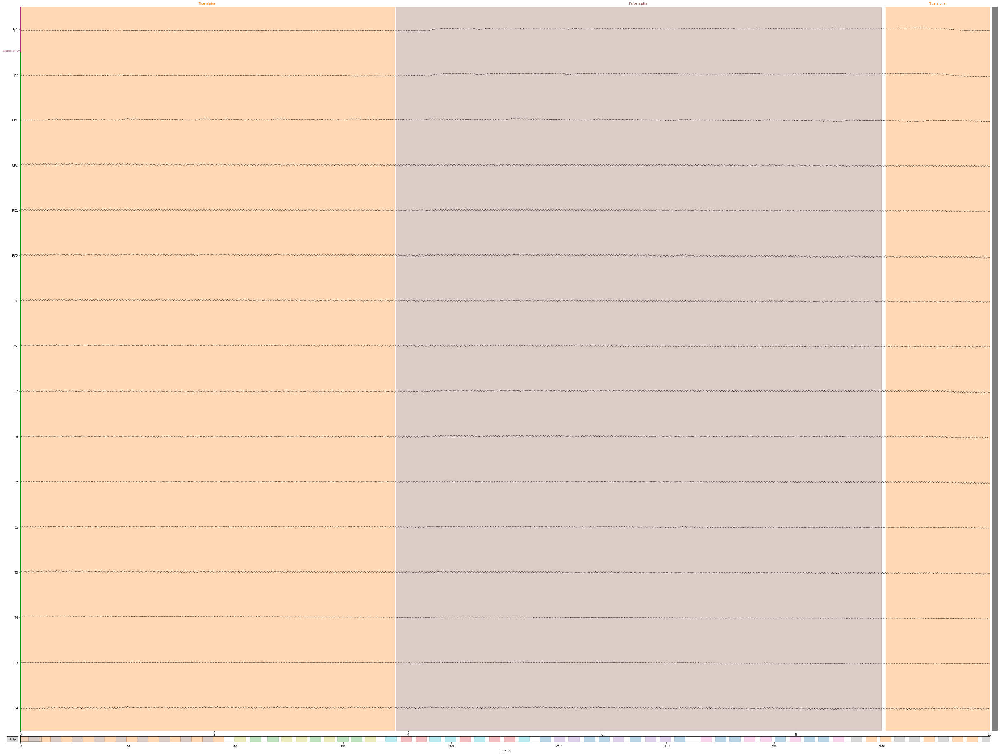

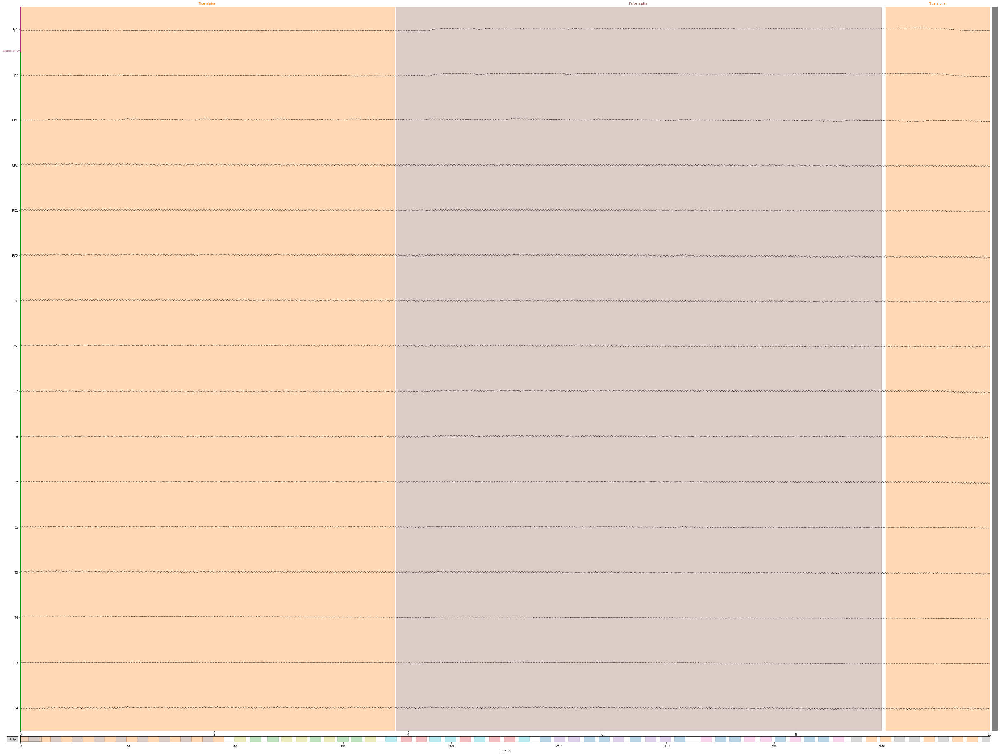

In [52]:
data_copy.plot(scalings='auto')

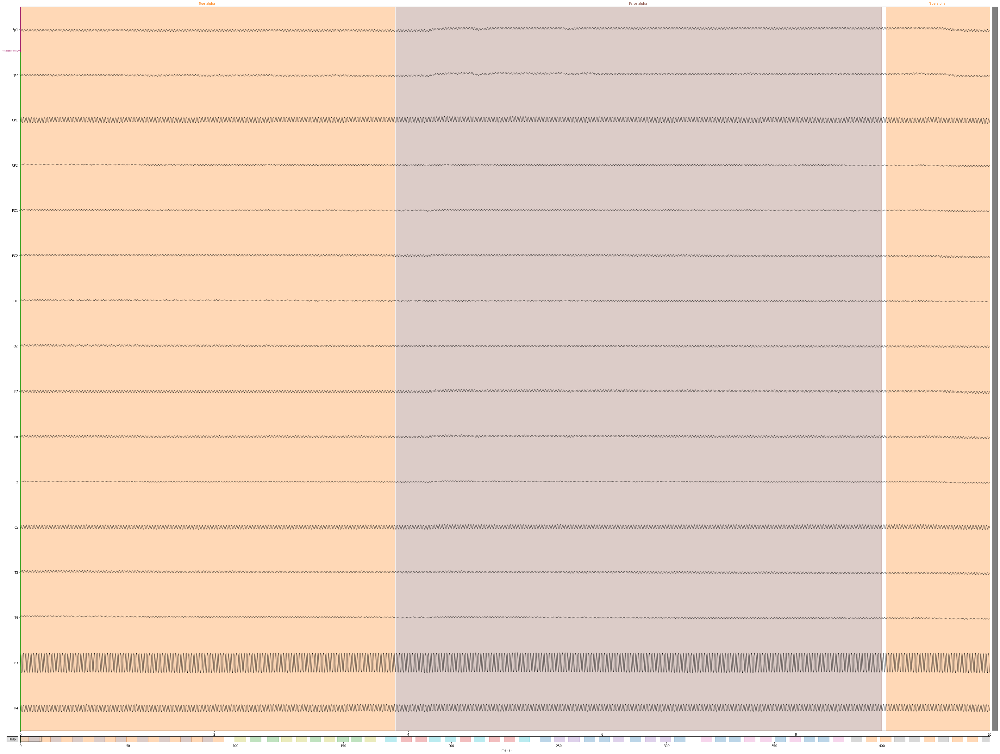

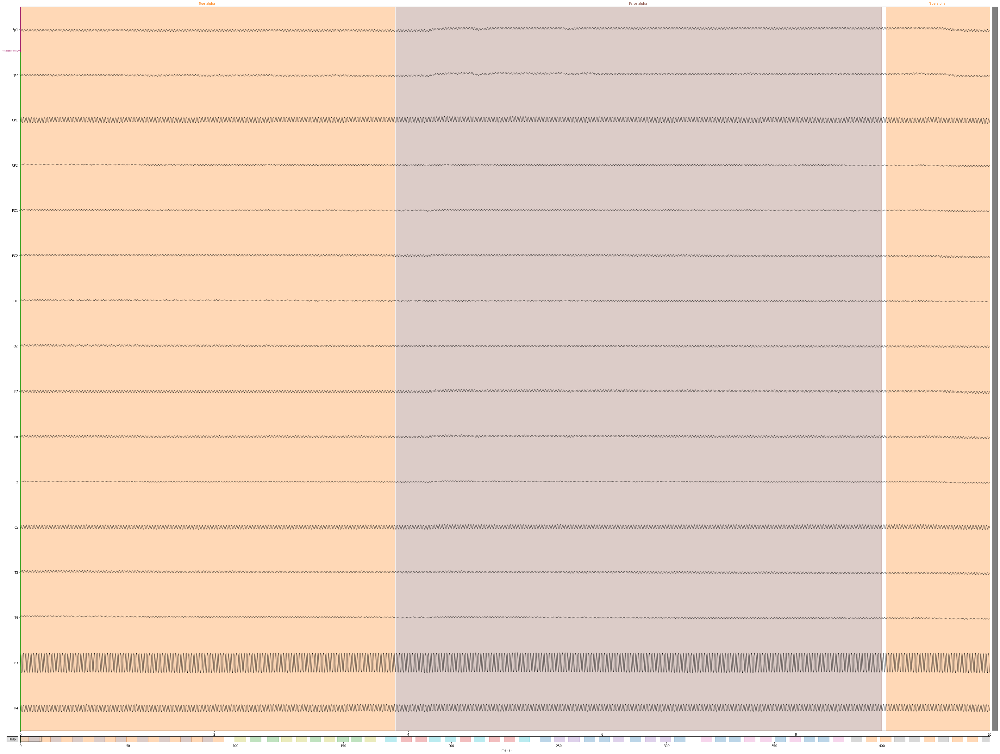

In [38]:
data.plot(scalings='auto')

# Alpha Waves
f2 specs should show a strong peak around 10-12Hz

In [29]:
f1, f2 = mdp.get_epochs('alpha', orig_data=data, channels=['O1', 'O2'], nperseg=2000, noverlap=1800)

Used Annotations descriptions: ['False-alpha-']
Not setting metadata
Not setting metadata
9 matching events found
No baseline correction applied
0 projection items activated
Loading data for 9 events and 5001 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['True-alpha-']
Not setting metadata
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Loading data for 10 events and 5001 original time points ...
0 bad epochs dropped
true_found is: True


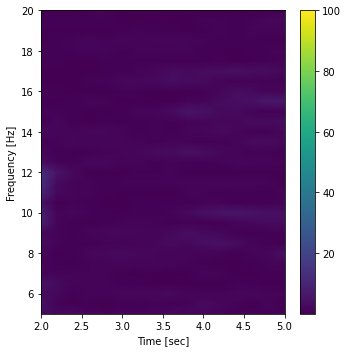

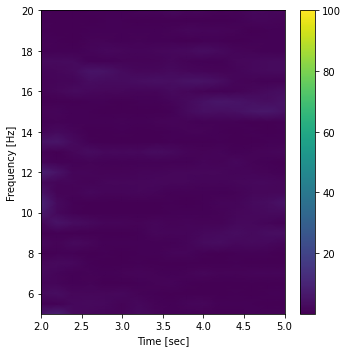

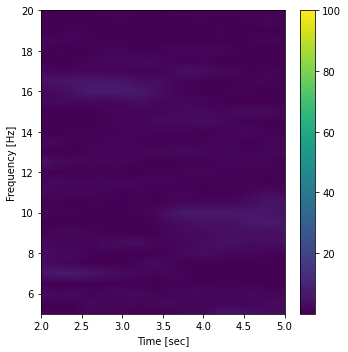

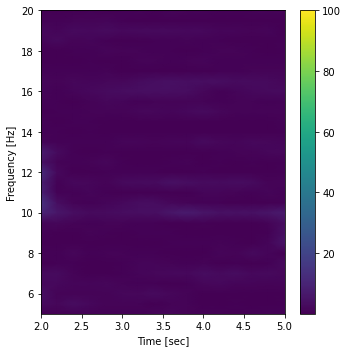

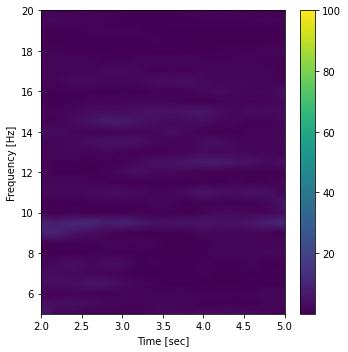

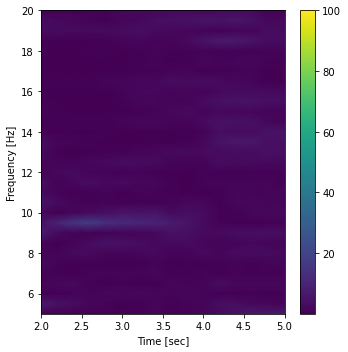

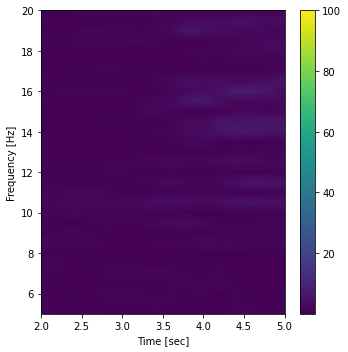

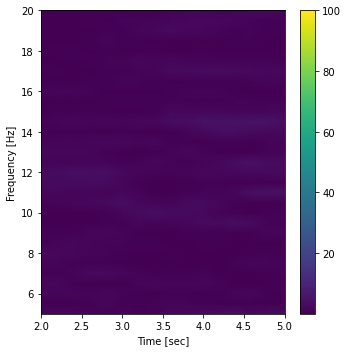

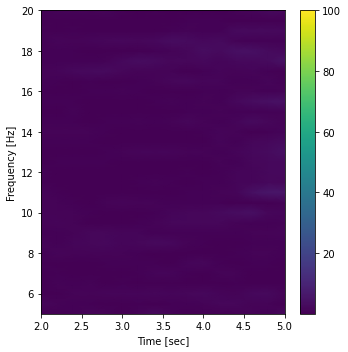

In [30]:
for i in range(len(f1.specs)):
    mdp.plot_spectrogram(f1.ts[i], f1.fs[i], f1.specs[i], ylim=[5, 20], vmax=100)

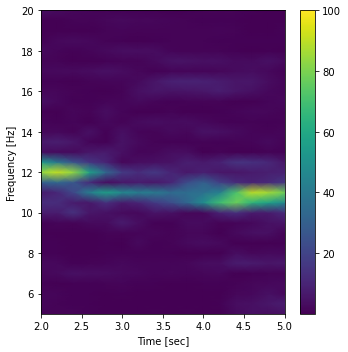

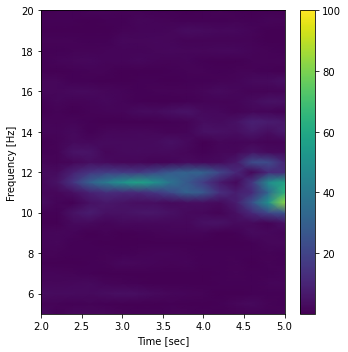

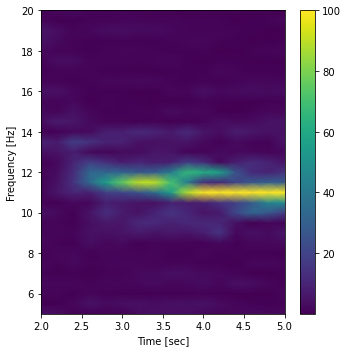

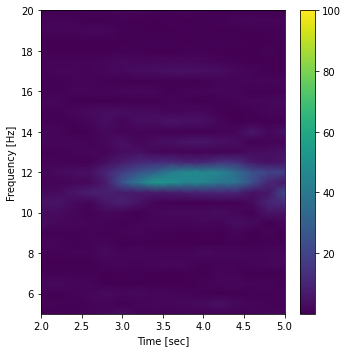

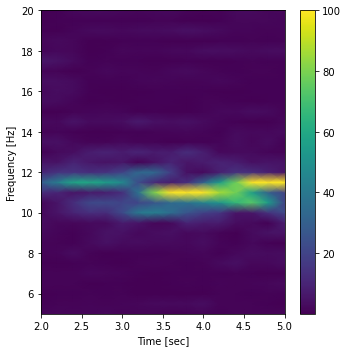

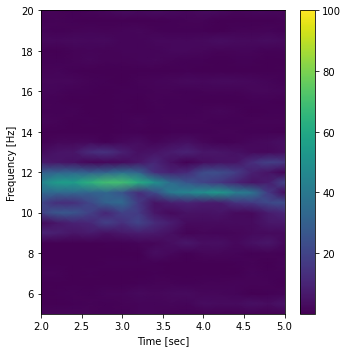

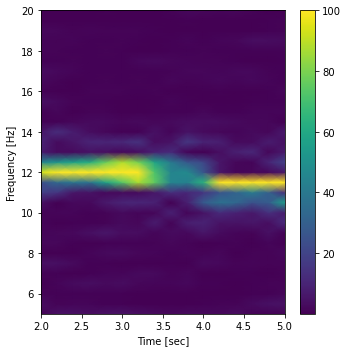

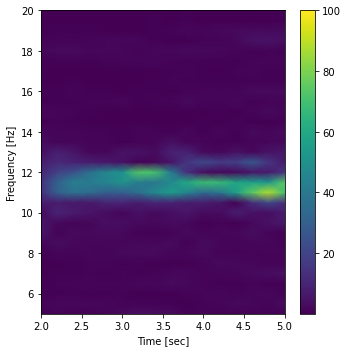

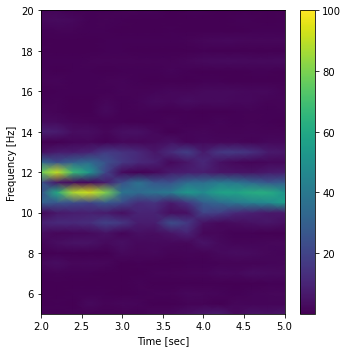

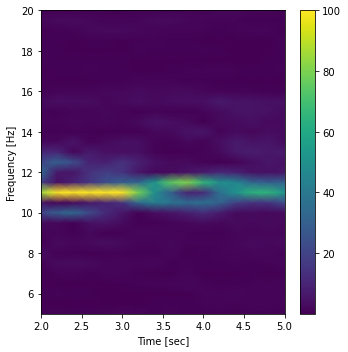

In [31]:
for i in range(len(f2.specs)):
    mdp.plot_spectrogram(f2.ts[i], f2.fs[i], f2.specs[i], ylim=[5, 20], vmax=100)

# SSVEP
f1 should show strong signal around 15hz, f2 strong signal around 10 and 20hz

In [65]:
chns = ['O1', 'O2', 'P3', 'P4']
print(data.ch_names)
print(chns)

f1, f2 = mdp.get_epochs('SSVEP', orig_data=data, channels=chns, nperseg=2000, noverlap=1800)

['Fp1', 'Fp2', 'CP1', 'CP2', 'FC1', 'FC2', 'O1', 'O2', 'F7', 'F8', 'Fz', 'Cz', 'T3', 'T4', 'P3', 'P4']
['O1', 'O2', 'P3', 'P4']
Used Annotations descriptions: ['False-SSVEP-']
5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 5 events and 5001 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['True-SSVEP-']
5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 5 events and 5001 original time points ...
0 bad epochs dropped
true_found is: True


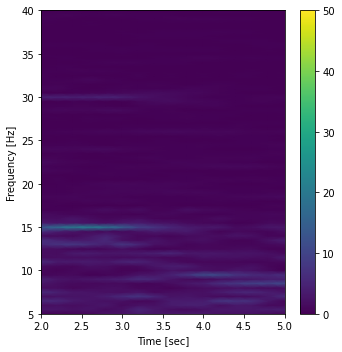

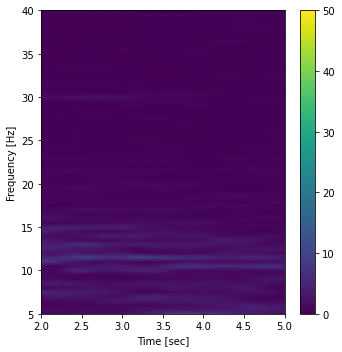

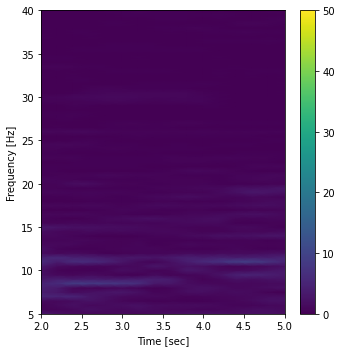

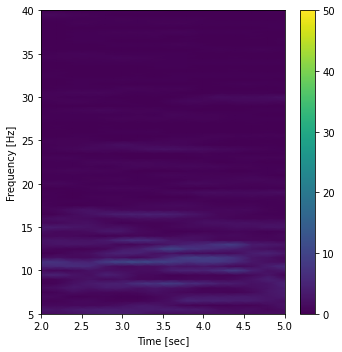

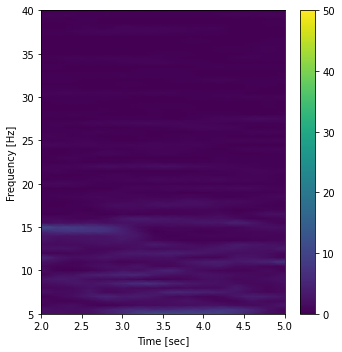

In [66]:
for i in range(len(f1.specs)):
    mdp.plot_spectrogram(f1.ts[i], f1.fs[i], f1.specs[i], ylim=[5, 40], vmax=50)

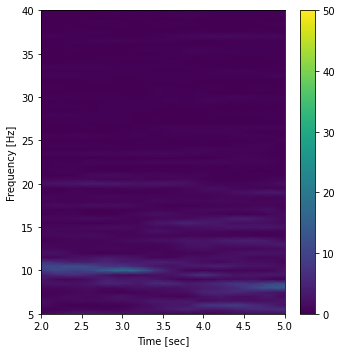

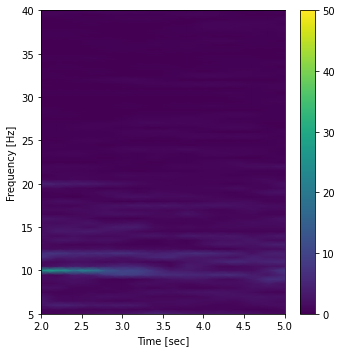

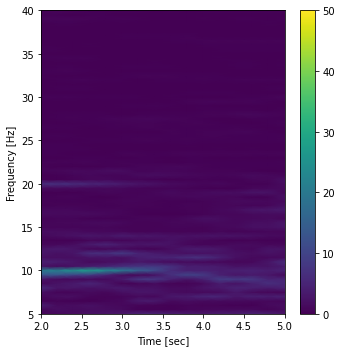

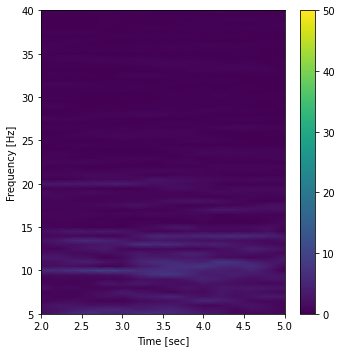

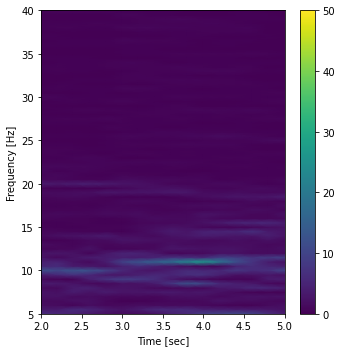

In [67]:
for i in range(len(f2.specs)):
    mdp.plot_spectrogram(f2.ts[i], f2.fs[i], f2.specs[i], ylim=[5, 40], vmax=50)

# Remove Bad Channels

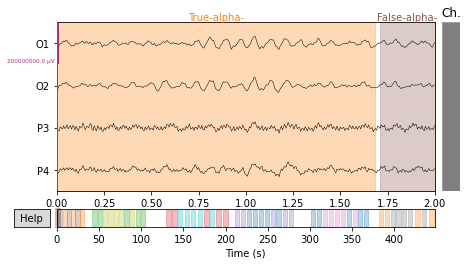

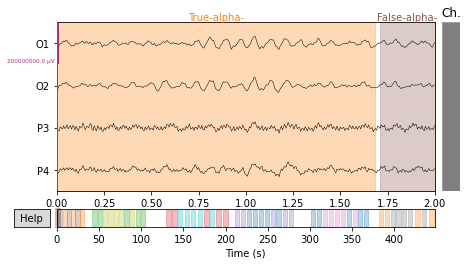

In [68]:
chns = data.info.ch_names

picks= ["O1", "O2", "P3", "P4"]

chn_idxs = [chns.index(chn) for chn in picks]

data.plot(scalings=100, order=chn_idxs, n_channels=4, duration=2)

Standard Deviation of Channel 0: 
12.01129098640797


Standard Deviation of Channel 1: 
33.49920647930678


Standard Deviation of Channel 2: 
7.174571004861353


Standard Deviation of Channel 3: 
7.4265964816710115


Standard Deviation of Channel 4: 
8.140685507922042


Standard Deviation of Channel 5: 
7.598528460241877


Standard Deviation of Channel 6: 
7.972331947101514


Standard Deviation of Channel 7: 
7.643230144325213


Standard Deviation of Channel 8: 
10.998337516516719


Standard Deviation of Channel 9: 
32.95916473949559


Standard Deviation of Channel 10: 
7.708917256474303


Standard Deviation of Channel 11: 
103.33530471978563


Standard Deviation of Channel 12: 
4.811717095014268


Standard Deviation of Channel 13: 
7.3474643339853065


Standard Deviation of Channel 14: 
11.716975928767438


7.972331947101514
25.221853655528154


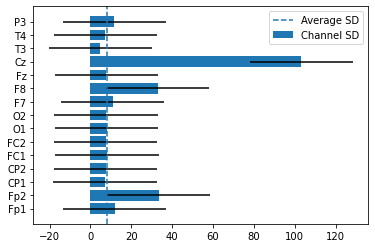

In [55]:
# find standard deviation for each channel
import statistics as st
import matplotlib.pyplot as plt

# sd = st.stdev(data[15][0][0][0:-1]))
# print(st.stdev(data[15][0][0][0:-1]))

i = 0

# print(chn_idxs)
# print(len(data.ch_names))

data.stdev = []

# I want to index through the channels and print standard deviations but I can't index through the channels by name
# for i in range(len(data.ch_names)):
for i in range(len(data.ch_names[0:-1])):
    print("Standard Deviation of Channel " + str(i) + ": ")
    sd = st.stdev(data[i][0][0][0:-1])
    print(sd)
    print("\n")
    
    data.stdev.append(sd)
    
avg_sd = st.median(data.stdev)
print(avg_sd)

x = range(len(data.ch_names[0:-1]))
y = data.stdev

sd2 = st.stdev(y) #standard deviation of the channel standard deviations
print(sd2)
    
# now that I have all the standard deviations plot them so I can see the outliers
fig = plt.barh(x, y, tick_label=data.ch_names[0:-1], label='Channel SD', xerr=sd2)
# ax = plt.subplot(data.stdev, xlabel='channels')
# plt.set_xlabel('x-axis', fontsize="8")
# plt.set_ylabel('y-axis', fontsize='12')
# plt.bar_label(ax, ch_names[0:3])
plt.axvline(avg_sd, linestyle="--", label='Average SD')
# plt.errorbar(x, y, yerr=3)
plt.legend()
plt.show(fig)

## Remove any channels where the error bars don't overlap the average SD

In [56]:
ch_rmv = []

for i in x:
    #rel is a variable to mark whether the current bar sits above or below the average
    if data.stdev[i] > avg_sd:
        rel = 'above'
    if data.stdev[i] < avg_sd:
        rel = 'below'
        
    if rel == 'above':
        chk = data.stdev[i] - sd2
        if chk > avg_sd:
            print("remove " + str(i))
            ch_rmv.append(i)
        
    if rel == 'below':
        chk = data.stdev[i] + sd2
        if chk < avg_sd:
            print("remove " + str(i))
            ch_rmv.append(i)
        

remove 1
remove 11


In [119]:
ch_rmv

[11]

# Check for missing data from raw data

In [1]:
import pickle as pk

path = r'C:\Users\words\OneDrive - Regis University\laryngeal_bci\data\pickles\\'
file = 'BCIproject_trial-1.2-22-2021.pk'

with open(path + file, 'rb') as f:
    data = pk.load(f)

In [3]:
data.shape

(31, 449999)

In [4]:
import pandas as pd

df = pd.DataFrame(data.T)

<AxesSubplot:>

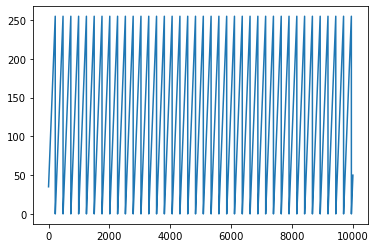

In [9]:
df.iloc[:10000, 0].plot()

<AxesSubplot:ylabel='Frequency'>

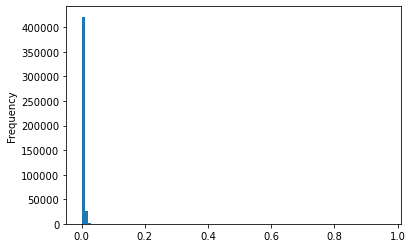

In [19]:
df[30].diff().plot.hist(bins=100)

In [23]:
df[30].diff().mode()[0]

2.384185791015625e-06

<AxesSubplot:>

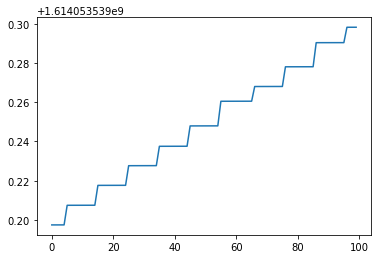

In [27]:
df[30].iloc[:100].plot()

In [29]:
pd.to_datetime(df[30], unit='s')

0        2021-02-23 04:12:19.197451115
1        2021-02-23 04:12:19.197453976
2        2021-02-23 04:12:19.197457075
3        2021-02-23 04:12:19.197459936
4        2021-02-23 04:12:19.197462797
                      ...             
449994   2021-02-23 04:19:55.054201841
449995   2021-02-23 04:19:55.054204464
449996   2021-02-23 04:19:55.054206848
449997   2021-02-23 04:19:55.054209232
449998   2021-02-23 04:19:55.054211617
Name: 30, Length: 449999, dtype: datetime64[ns]

<AxesSubplot:>

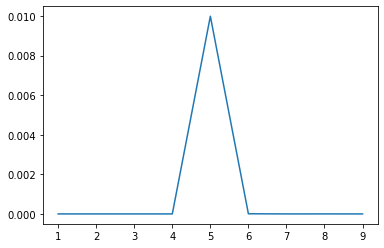

In [25]:
df[30].iloc[:10].diff().plot()

In [15]:
df[30].iloc[-1] - df[30].iloc[0]

455.8567605018616

In [17]:
455/60

7.583333333333333